The collected dataset details a study area including four wilderness areas located in the Roosevelt National Forest of northern Colorado. Each observation is a 30m x 30m patch. This dataset was used for a Kaggle competition in which participants would predict an integer classification for the forest cover type using a variety of collected information for each patch. The seven types are:

1 - Spruce/Fir
2 - Lodgepole Pine
3 - Ponderosa Pine
4 - Cottonwood/Willow
5 - Aspen
6 - Douglas-fir
7 - Krummholz

As such, I will be doing the same through the use of decision trees, random forests, and a Keras neural network, all tailored to perform best with the dataset, to see just how accurately these models can become with so many variables alongside seeing how the size of categorical variables affect the models of the accuracy. First, we must explore the dataset to understand various correlations and quirks found within before working on our models.

In [22]:
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import io
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn import tree
from IPython.display import Image
import pydotplus
import graphviz
from sklearn import ensemble
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Dense
import requests
%matplotlib inline

In [23]:
url = ''
temp = pd.read_csv('C:\\Users\\Trevor\\Documents\\Thinkful\\covtype.csv')
orig = pd.DataFrame(temp)
orig.head(5)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


In [24]:
orig.isnull().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


Thankfully, there's not a single null value in our dataset, meaning that no rows will need to be removed or filled in by means such as interpolation or mean-filling due to lack of necessary information.

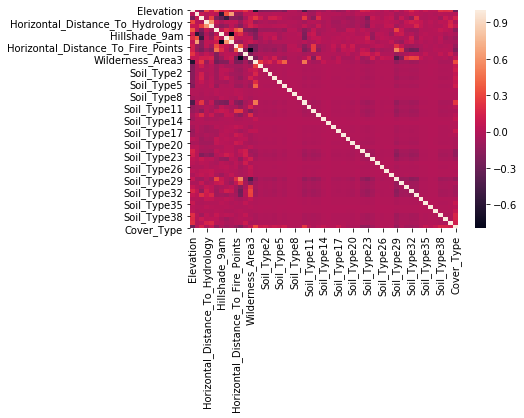

In [25]:
sns.heatmap(orig.corr())

Since there's such a large amount of soil types, and a few wilderness types as well, let's reduce them each into a single column for the sake of saving space and simplicity in correlations and future model building.

In [26]:
#New dataframe with single-column variables
trees = orig[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm','Horizontal_Distance_To_Fire_Points', 'Cover_Type']]

#Turning all soil columns into a single column with integers from 1 - 40
trees['Soil']=0
for i in range(1,41):
       trees['Soil'] = trees['Soil'] + i*orig['Soil_Type'+str(i)]
        
#List for future use of all columns besides 
rel = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm','Horizontal_Distance_To_Fire_Points']

#Turning Cover and Soil integers into strings for ease of use as categorical variables
trees[['Cover_Type', 'Soil']] = trees[['Cover_Type', 'Soil']].astype(str)

#List of cover types for future labeling
cov = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 'Cottonwood/Willow', 'Aspen', 'Douglas-fir', 'Krummholz']
    
#Turning all Area columns into a single column
trees['Area']=0
for i in range(1,5):
       trees['Area'] = trees['Area'] + i*orig['Wilderness_Area'+str(i)]
        
#Turning Area integers into strings for ease of use as categorical variables
trees['Area'] = trees['Area'].astype(str)

C:\Users\Trevor\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\Trevor\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Users\Trevor\Anaconda3\lib\site-packages\pandas\core\frame.py:3509: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pand

In [6]:
export_csv = trees.to_csv (r'C:\\Users\\Trevor\\Documents\\Thinkful\\trees.csv', index = None, header=True)

What I've done now is made an new dataframe that's essentially an updated, more-useable version of the original dataframe. Since there were 40 soil columns, each column for a soil type indicating 0 for 'No' and 1 for 'Yes', I decided to combine them all into one column with the soil column's original number (0 - 39), indicating which soil type is present for the patch of land studied. I've also made the values into strings such that they can be used as categorical variables. I've done the same for Area as well.



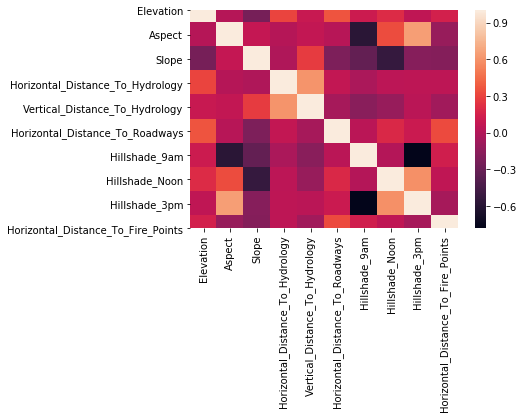

In [7]:
sns.heatmap(trees[rel].corr())

Now our heatmap is much easier to look at and easier to determine correlations of. However, one thing to consider is that, while 'Soil' is numeric in value, it's categorical, determining soil type, and isn't a quantitative value. This is why it was left out of our heatmap. The same goes for 'Cover Type'.

At a glance, we can see that Aspect and Hillshade, Vertical and Hortizontal Distance to Hydrology, and the Hillshades all have the most standoutish positive correlations. However, what also stands out is that some correlations have very strong negative correlations. 

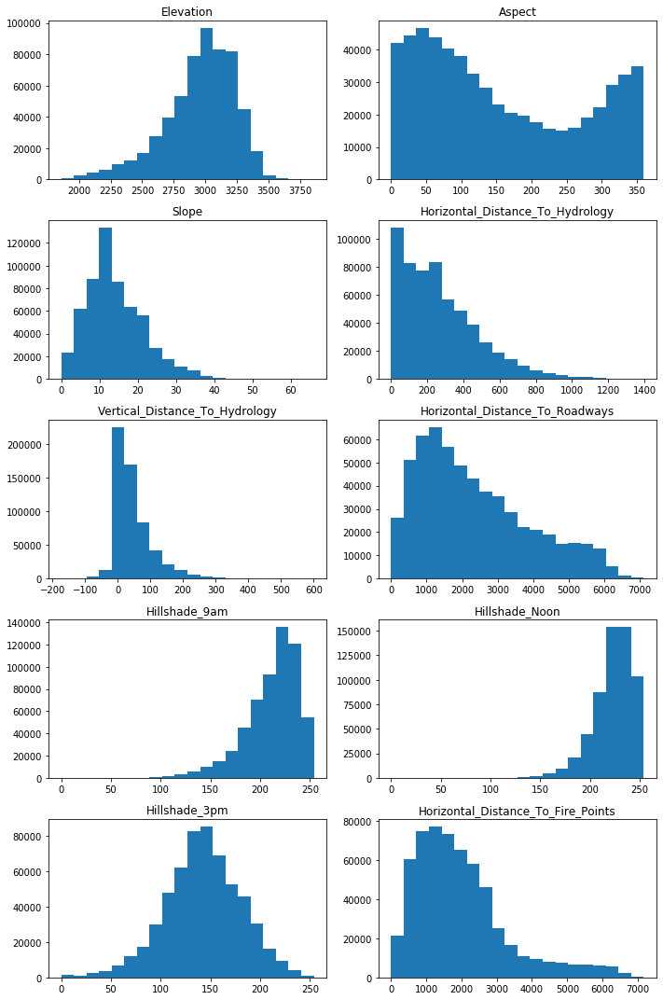

In [8]:
plt.figure(figsize = (10, 15))

n = 1
for i in rel:
    plt.subplot(5, 2, n)
    plt.hist(trees[i], bins = 20)
    plt.title(i)
    n += 1

plt.tight_layout()
plt.show()

As we can see from our histograms, much of the data is heavily skewed to one side, while some is relatively normal in their distribution, such as Hillshade_3pm and Slope. Then, interestingly enough, Aspect has a wave-like distribution.

While seeing our data distributed across its actual values is useful in exploring how our observations actually are in reality, it's important that we normalize these values for the sake of having a smaller scale to work with. This is an incredibly important step in prepping our data to be used by our classifiers.

In [9]:
trees.head(10)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type,Soil,Area
0,2596,51,3,258,0,510,221,232,148,6279,5,29,1
1,2590,56,2,212,-6,390,220,235,151,6225,5,29,1
2,2804,139,9,268,65,3180,234,238,135,6121,2,12,1
3,2785,155,18,242,118,3090,238,238,122,6211,2,30,1
4,2595,45,2,153,-1,391,220,234,150,6172,5,29,1
5,2579,132,6,300,-15,67,230,237,140,6031,2,29,1
6,2606,45,7,270,5,633,222,225,138,6256,5,29,1
7,2605,49,4,234,7,573,222,230,144,6228,5,29,1
8,2617,45,9,240,56,666,223,221,133,6244,5,29,1
9,2612,59,10,247,11,636,228,219,124,6230,5,29,1


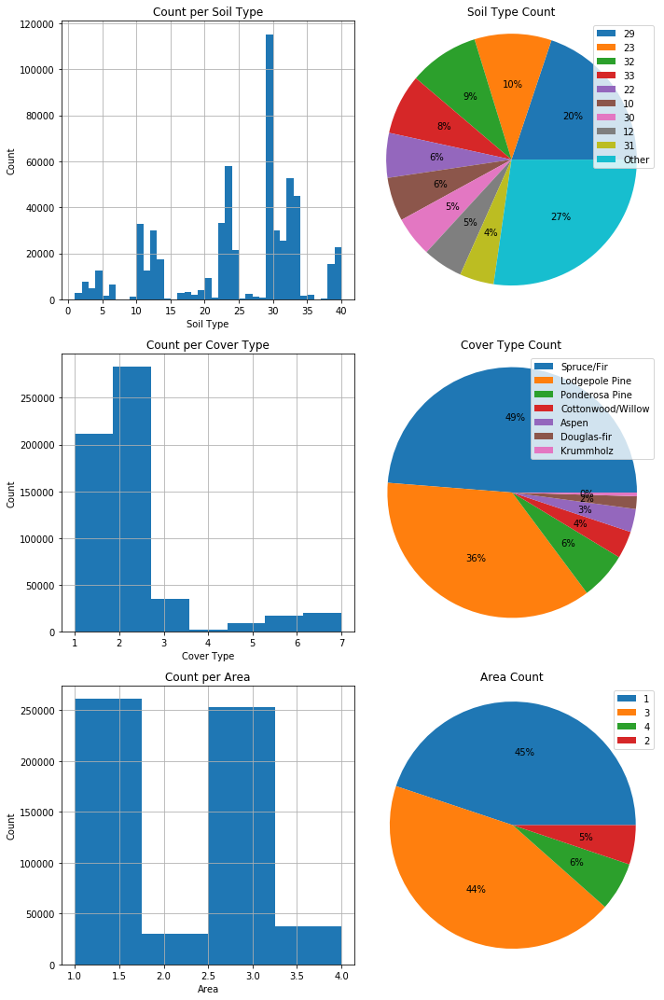

In [10]:
plt.figure(figsize = (10, 15))

plt.subplot(3, 2, 1)
trees.Soil.astype(int).hist(bins = 39)
plt.title('Count per Soil Type')
plt.xlabel('Soil Type')
plt.ylabel('Count')

plt.subplot(3, 2, 2)
all = trees['Soil']
soils = pd.DataFrame(all)

amount = pd.DataFrame(soils['Soil'].value_counts())
other = int(amount[9:].sum())
amount = amount[:9]
amount.loc[9] = other
amount = amount.rename(index = {9: 'Other'})

plt.pie(amount['Soil'], autopct = '%1.00f%%')
plt.axis('equal')
plt.title('Soil Type Count')
    
leg = amount.index
#leg = leg.sort_values()
plt.legend(leg)

plt.subplot(3, 2, 3)
trees['Cover_Type'].astype(int).hist(bins = 7)
plt.title('Count per Cover Type')
plt.xlabel('Cover Type')
plt.ylabel('Count')

plt.subplot(3, 2, 4)
all = trees['Cover_Type']
cover = pd.DataFrame(all)

amount = pd.DataFrame(cover['Cover_Type'].value_counts())

plt.pie(amount['Cover_Type'], autopct = '%1.00f%%')
plt.axis('equal')
plt.title('Cover Type Count')
    
leg = amount.index
#leg = leg.sort_values()
plt.legend(cov)

plt.subplot(3, 2, 5)
trees['Area'].astype(int).hist(bins = 4)
plt.title('Count per Area')
plt.xlabel('Area')
plt.ylabel('Count')

plt.subplot(3, 2, 6)
all = trees['Area']
cover = pd.DataFrame(all)

amount = pd.DataFrame(cover['Area'].value_counts())

data_sorted = amount.sort_values(['Area'])
#data_sorted.plot(kind='pie', y='Area', legend = True)

plt.pie(amount['Area'], autopct = '%1.00f%%')
plt.axis('equal')
plt.title('Area Count')
    
leg = amount.index
#leg = leg.sort_values()
plt.legend(leg)

plt.tight_layout()
plt.show()

From our soil distribution chart, we can see that our soil data is unfortunately distributed incredibly unevenly, such that for some types we have a great amount of information to work with, while with others, we have comparatively none. It also helps to see on our pie chart just how large the ten largest soil types in our data are compared to the other 29 combined.

For cover, we can also see an even more uneven distribution, with cover types 1 and 2 taking up a combined 85% of the dataset.

As with soil and cover, area is also distributed unevenly, heavily based on areas 1 and 3, combined taking up 89% of the dataset.

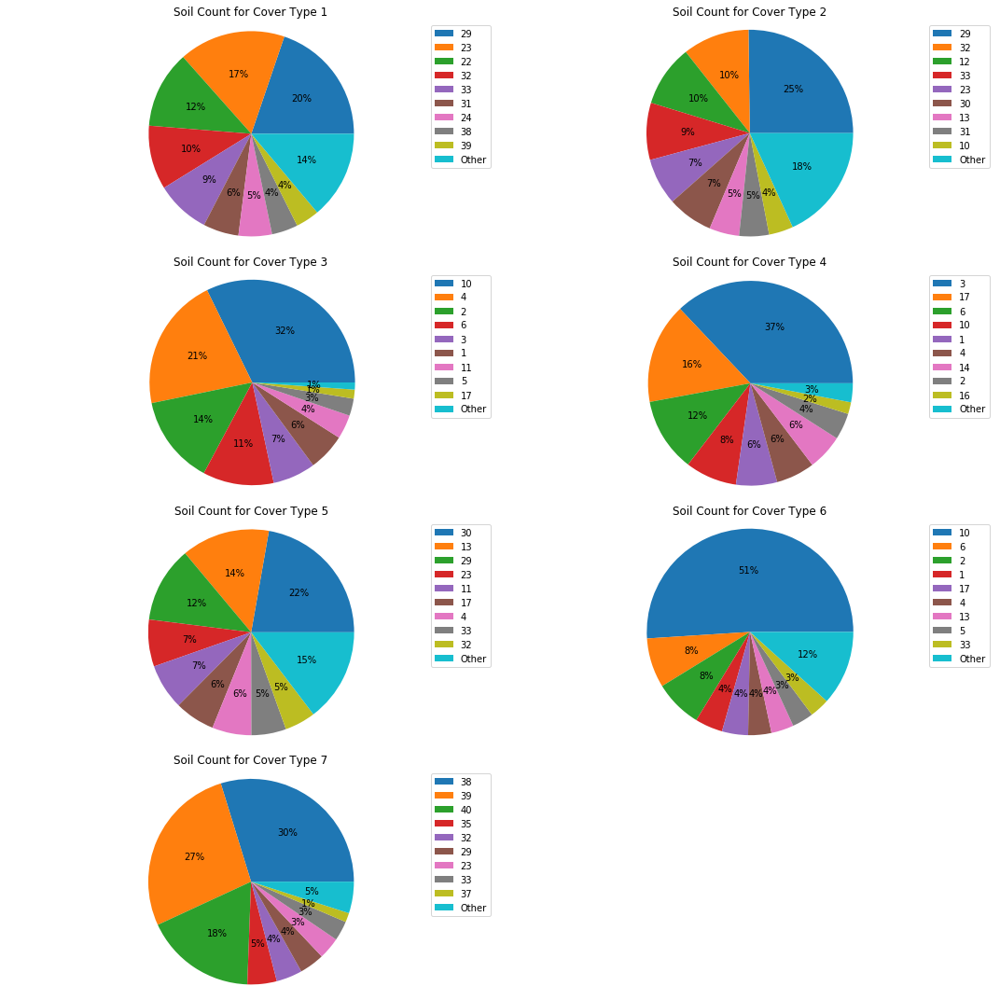

In [11]:
plt.figure(figsize = (15, 15))

for i in range(1, 8):
    sopi = pd.DataFrame()
    sopi = trees['Soil'][trees['Cover_Type'] == str(i)]
    
    #Dataframe of soil column
    all = trees['Soil'][trees['Cover_Type'] == str(i)]
    soils = pd.DataFrame(all)

    #Makes top nine soils then tenth other column for everything else
    amount = pd.DataFrame(soils.Soil.value_counts())
    other = int(amount[9:].sum())
    amount = amount[:9]
    amount.loc[9] = other
    amount = amount.rename(index = {9: 'Other'})

    
    plt.subplot(4, 2, i)
    plt.pie(amount['Soil'], autopct = '%1.00f%%')
    plt.axis('equal')
    plt.title('Soil Count for Cover Type ' + str(i))
    
    leg = amount.index
    
    plt.legend(leg)
    
plt.tight_layout()
plt.show()

As expected, each cover type has its own unique distributions of soil makeups.

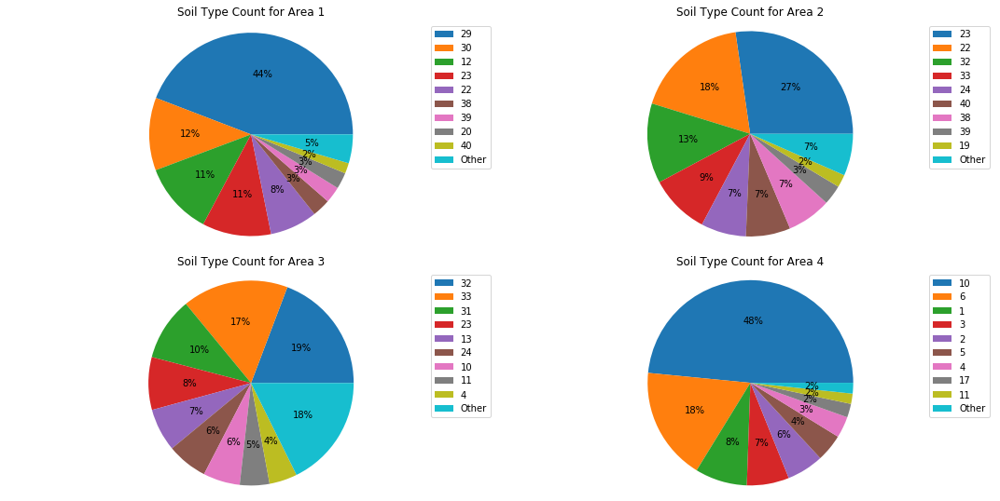

In [12]:
plt.figure(figsize = (15, 15))

for i in range(1, 5):
    sopi = pd.DataFrame()
    sopi = trees['Soil'][trees['Cover_Type'] == str(i)]
    
    #Dataframe of soil column
    all = trees['Soil'][trees['Area'] == str(i)]
    areas = pd.DataFrame(all)

    #Makes top nine soils then tenth other column for everything else
    amount = pd.DataFrame(areas.Soil.value_counts())
    other = int(amount[9:].sum())
    amount = amount[:9]
    amount.loc[9] = other
    amount = amount.rename(index = {9: 'Other'})

    
    plt.subplot(4, 2, i)
    plt.pie(amount['Soil'], autopct = '%1.00f%%')
    plt.axis('equal')
    plt.title('Soil Type Count for Area ' + str(i))
    
    leg = amount.index
    
    plt.legend(leg)
    
plt.tight_layout()
plt.show()

Our areas as well are each made up on their own unique soil distributions.

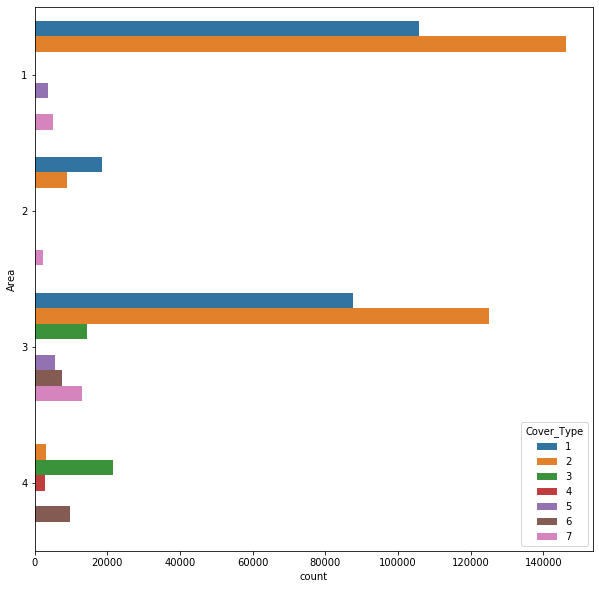

In [13]:
plt.figure(figsize = (10, 10))
sns.countplot(y="Area", hue="Cover_Type", data=trees)
plt.show()

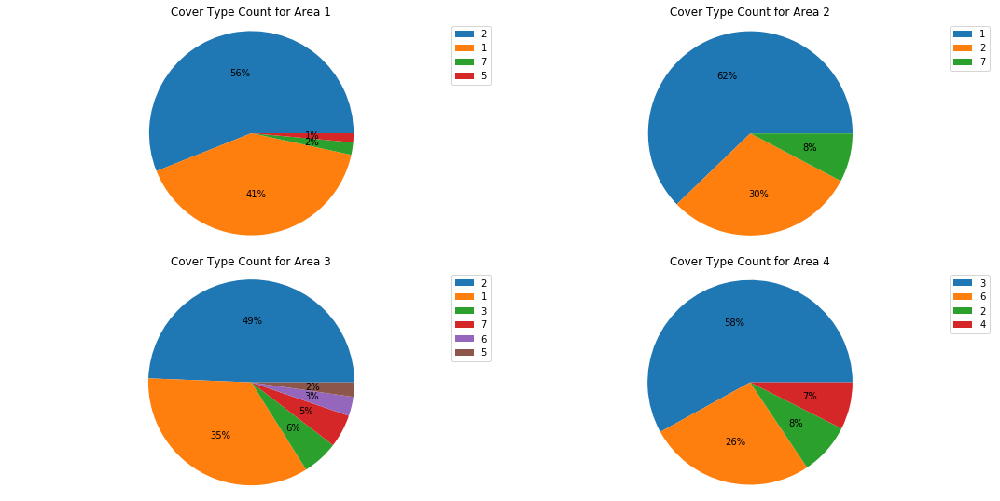

In [14]:
plt.figure(figsize = (15, 15))

for i in range(1, 5):
    sopi = pd.DataFrame()
    sopi = trees['Cover_Type'][trees['Area'] == str(i)]
    
    #Dataframe of soil column
    all = trees['Cover_Type'][trees['Area'] == str(i)]
    areas = pd.DataFrame(all)

    #Makes top nine soils then tenth other column for everything else
    amount = pd.DataFrame(areas['Cover_Type'].value_counts())
    #other = int(amount[9:].sum())
    #amount = amount[:9]
    #amount.loc[9] = other
    #amount = amount.rename(index = {9: 'Other'})

    
    plt.subplot(4, 2, i)
    plt.pie(amount['Cover_Type'], autopct = '%1.00f%%')
    plt.axis('equal')
    plt.title('Cover Type Count for Area ' + str(i))
    
    leg = amount.index
    
    plt.legend(leg)
    
plt.tight_layout()
plt.show()

As expected by previous charts, all of our cover types per area are dominated particularly by the Spruce/Firs and Lodgepole Pines since they make up together 89% of our dataset.

Now that I've properly investigated all of the data, I'll use a Randomized Search Cross-Value function to determine the best hyperparameters for the decision tree and random forest models for the best results. For the Keras neural network, I've trained and tuned the model manually elsewhere through trial and error to create the best possible set of layers.

In [15]:
X = trees[rel]
y = trees['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = y)

In [ ]:
max_features = [4, 6, 8, 10]
max_depth = [4, 6, 8, 10, 12]
min_samples_split = [2, 5, 7, 10]
min_samples_leaf = [1, 2, 4]

random_grid = {'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

rf = DecisionTreeClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
rf_random.fit(X_train, y_train)

rf_random.best_params_

In [ ]:
max_features = [4, 6, 8, 10]
max_depth = [4, 6, 8, 10, 12]
min_samples_split = [2, 5, 7, 10]
min_samples_leaf = [1, 2, 4]

random_grid = {'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
rf_random.fit(X_train, y_train)

rf_random.best_params_

Now that we know our strongest hyperparameters of the sets we gave, we can plug them into our models to get the highest accuracy we can.

In [29]:
X = trees[rel]
y = trees['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = y)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.070871 to fit



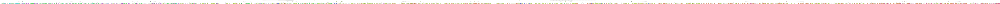

In [30]:
import time

start = time.time()

decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 8,
    max_depth = 12,
    random_state = 750
)
#want to pass x_train, y_train here and for every other model
decision_tree.fit(X_train, y_train)

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [31]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [32]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 8,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [33]:
def get_val_array(val):
    cover = []
    for i in list(val.values):
        temp = [0, 0, 0, 0, 0, 0, 0]
        temp[int(i) - 1] = 1
        cover.append(temp)

    cover = np.array(cover)

    return cover

In [34]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

In [35]:
model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

Train on 435759 samples, validate on 145253 samples
Epoch 1/200
435759/435759 [==============================] - 3s 6us/step - loss: 0.6864 - accuracy: 0.7070 - val_loss: 0.6085 - val_accuracy: 0.7361
Epoch 2/200
435759/435759 [==============================] - 3s 6us/step - loss: 0.5889 - accuracy: 0.7431 - val_loss: 0.5755 - val_accuracy: 0.7500
Epoch 3/200
435759/435759 [==============================] - 2s 5us/step - loss: 0.5518 - accuracy: 0.7603 - val_loss: 0.5335 - val_accuracy: 0.7687
Epoch 4/200
435759/435759 [==============================] - 3s 6us/step - loss: 0.5251 - accuracy: 0.7739 - val_loss: 0.5108 - val_accuracy: 0.7801
Epoch 5/200
435759/435759 [==============================] - 3s 6us/step - loss: 0.5049 - accuracy: 0.7834 - val_loss: 0.5025 - val_accuracy: 0.7850
Epoch 6/200
435759/435759 [==============================] - 2s 5us/step - loss: 0.4895 - accuracy: 0.7909 - val_loss: 0.4848 - val_accuracy: 0.7933
Epoch 7/200
435759/435759 [===========================

In [36]:
values = pd.DataFrame([[cv, cv2, cv3]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
values

,Decision Tree,Random Forest,Keras
0,0.787337,0.828183,0.89236


In [37]:
X = trees[rel + ['Area']]
y = trees['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = trees[['Area', 'Cover_Type']])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0747803 to fit



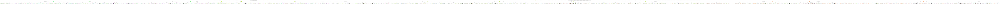

In [38]:
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12,
    random_state = 750
)
decision_tree.fit(X_train, y_train)

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [39]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [40]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [41]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

need2 = pd.DataFrame([[np.mean(cv), np.mean(cv2), np.mean(cv3)]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
values = values.append(need2)
values

Train on 435759 samples, validate on 145253 samples
Epoch 1/200
435759/435759 [==============================] - 2s 6us/step - loss: 0.6789 - accuracy: 0.7115 - val_loss: 0.5958 - val_accuracy: 0.7403
Epoch 2/200
435759/435759 [==============================] - 3s 6us/step - loss: 0.5638 - accuracy: 0.7552 - val_loss: 0.6005 - val_accuracy: 0.7356
Epoch 3/200
435759/435759 [==============================] - 2s 5us/step - loss: 0.5234 - accuracy: 0.7744 - val_loss: 0.5104 - val_accuracy: 0.7818
Epoch 4/200
435759/435759 [==============================] - 3s 6us/step - loss: 0.4913 - accuracy: 0.7895 - val_loss: 0.4839 - val_accuracy: 0.7939
Epoch 5/200
435759/435759 [==============================] - 2s 5us/step - loss: 0.4646 - accuracy: 0.8014 - val_loss: 0.4797 - val_accuracy: 0.7929
Epoch 6/200
435759/435759 [==============================] - 2s 6us/step - loss: 0.4454 - accuracy: 0.8100 - val_loss: 0.4397 - val_accuracy: 0.8130
Epoch 7/200
435759/435759 [===========================

,Decision Tree,Random Forest,Keras
0,0.787337,0.828183,0.892360
0,0.792025,0.834145,0.912257


In [42]:
X = trees[rel + ['Soil']]
y = trees['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = trees[['Cover_Type', 'Soil']])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0774784 to fit



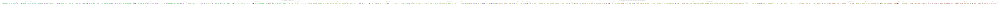

In [43]:
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12,
    random_state = 750
)
decision_tree.fit(X_train, y_train)

soil = list(trees.Soil.unique())
soil.sort()

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [44]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [46]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [47]:
X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

need3 = pd.DataFrame([[np.mean(cv), np.mean(cv2), np.mean(cv3)]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
values = values.append(need3)
values

Train on 435759 samples, validate on 145253 samples
Epoch 1/200
435759/435759 [==============================] - 3s 8us/step - loss: 0.6695 - accuracy: 0.7185 - val_loss: 0.5902 - val_accuracy: 0.7465
Epoch 2/200
435759/435759 [==============================] - 3s 7us/step - loss: 0.5676 - accuracy: 0.7543 - val_loss: 0.5597 - val_accuracy: 0.7622
Epoch 3/200
435759/435759 [==============================] - 3s 7us/step - loss: 0.5317 - accuracy: 0.7710 - val_loss: 0.5268 - val_accuracy: 0.7742
Epoch 4/200
435759/435759 [==============================] - 3s 7us/step - loss: 0.5083 - accuracy: 0.7819 - val_loss: 0.5073 - val_accuracy: 0.7826
Epoch 5/200
435759/435759 [==============================] - 3s 7us/step - loss: 0.4895 - accuracy: 0.7910 - val_loss: 0.5353 - val_accuracy: 0.7600
Epoch 6/200
435759/435759 [==============================] - 3s 7us/step - loss: 0.4729 - accuracy: 0.7997 - val_loss: 0.5064 - val_accuracy: 0.7794
Epoch 7/200
435759/435759 [===========================

,Decision Tree,Random Forest,Keras
0,0.787337,0.828183,0.892360
0,0.792025,0.834145,0.912257
0,0.802524,0.842819,0.902611


In [48]:
X = trees[rel + ['Soil', 'Area']]
y = trees['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = trees[['Area', 'Soil', 'Cover_Type']])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0764652 to fit



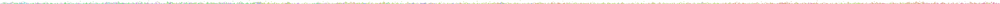

In [49]:
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 10,
    max_depth = 12,
    random_state = 750
)
decision_tree.fit(X_train, y_train)

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [50]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [51]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 10,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [52]:
X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

need4 = pd.DataFrame([[np.mean(cv), np.mean(cv2), np.mean(cv3)]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
values = values.append(need4)
values

Train on 435759 samples, validate on 145253 samples
Epoch 1/200
435759/435759 [==============================] - 4s 9us/step - loss: 0.6543 - accuracy: 0.7249 - val_loss: 0.5798 - val_accuracy: 0.7476
Epoch 2/200
435759/435759 [==============================] - 3s 8us/step - loss: 0.5342 - accuracy: 0.7707 - val_loss: 0.5173 - val_accuracy: 0.7791
Epoch 3/200
435759/435759 [==============================] - 4s 8us/step - loss: 0.4899 - accuracy: 0.7916 - val_loss: 0.4749 - val_accuracy: 0.8005
Epoch 4/200
435759/435759 [==============================] - 3s 7us/step - loss: 0.4586 - accuracy: 0.8069 - val_loss: 0.4534 - val_accuracy: 0.8071
Epoch 5/200
435759/435759 [==============================] - 3s 8us/step - loss: 0.4368 - accuracy: 0.8169 - val_loss: 0.4320 - val_accuracy: 0.8182
Epoch 6/200
435759/435759 [==============================] - 3s 7us/step - loss: 0.4183 - accuracy: 0.8253 - val_loss: 0.4129 - val_accuracy: 0.8296
Epoch 7/200
435759/435759 [===========================

,Decision Tree,Random Forest,Keras
0,0.787337,0.828183,0.892360
0,0.792025,0.834145,0.912257
0,0.802524,0.842819,0.902611
0,0.809760,0.849112,0.906226


In [53]:
ind = ['All - Area - Soil', 'All + Area - Soil', 'All - Area + Soil', 'All + Area + Soil']

values.index = ind
values

,Decision Tree,Random Forest,Keras
All - Area - Soil,0.787337,0.828183,0.892360
All + Area - Soil,0.792025,0.834145,0.912257
All - Area + Soil,0.802524,0.842819,0.902611
All + Area + Soil,0.809760,0.849112,0.906226


The above dataframe is a collection of the accuracy scores for the conducted decision tree and random forest models used on each of the four datasets. 

For the decision tree, we can see that the accuracy starts off pretty strong with the base dataset, slightly increases when Soil and Area are added, and then has a slightly larger increase with both added.

For the random forest, just like for the decision trees, we can see that upon including either 'Area' or 'Soil', the accuracy increases slightly. Yet, when both are included, the accuracy doesn't increase that much as with the decision trees. However, the accuracy still start out strong regardless, and all values are consistently higher than the strongest decision tree accuracy.

For the Keras neural network, it certainly was significantly higher in its accuracy among all categories in predicting cover type. When including just Area, it managed to jump up 2% in its accuracy. Yet, when just using Soil or both, the accuracy was still higher than with neither, but were interestingly lower than just using Area. Regardless, all accuracy values are higher than everything else the decision tree and random forest put out, so it's not much of a loss.

The reason RF has done better ovearll than DT is due to how decision trees are prone to dias and error in variance, which causes issues with overfitting. Through RF's use training on different samples of data and using a random subset of features, it is able to limit issues of overfitting without increasing error due to bias.

Perhaps due to the great unevenness in distribution of area, soil, and cover, some of our inaccuracy could possibly be reduced by turning the Area variable from seven types into a two types by reducing our dataset to just include that of Areas 1 and 3 since they take up 89% of our dataset.

In [54]:
treebin = trees[(trees.Area.isin(['1', '3']))]

In [55]:
X = treebin[rel]
y = treebin['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = y)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.091178 to fit



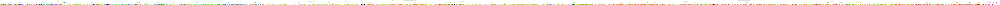

In [56]:
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 8,
    max_depth = 12,
    random_state = 750
)
#want to pass x_train, y_train here and for every other model
decision_tree.fit(X_train, y_train)

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [57]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [58]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 8,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [59]:
X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

valbin = pd.DataFrame([[cv, cv2, cv3]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
values

Train on 385620 samples, validate on 128540 samples
Epoch 1/200
385620/385620 [==============================] - 3s 8us/step - loss: 0.6678 - accuracy: 0.7220 - val_loss: 0.5664 - val_accuracy: 0.7567
Epoch 2/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.5460 - accuracy: 0.7664 - val_loss: 0.5252 - val_accuracy: 0.7773
Epoch 3/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.5109 - accuracy: 0.7817 - val_loss: 0.4971 - val_accuracy: 0.7863
Epoch 4/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4858 - accuracy: 0.7922 - val_loss: 0.4839 - val_accuracy: 0.7938
Epoch 5/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4659 - accuracy: 0.8013 - val_loss: 0.4584 - val_accuracy: 0.8054
Epoch 6/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4515 - accuracy: 0.8084 - val_loss: 0.4493 - val_accuracy: 0.8099
Epoch 7/200
385620/385620 [===========================

,Decision Tree,Random Forest,Keras
All - Area - Soil,0.787337,0.828183,0.892360
All + Area - Soil,0.792025,0.834145,0.912257
All - Area + Soil,0.802524,0.842819,0.902611
All + Area + Soil,0.809760,0.849112,0.906226


In [60]:
X = treebin[rel + ['Area']]
y = treebin['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = treebin[['Area', 'Cover_Type']])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0925791 to fit



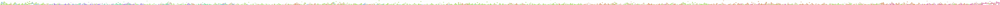

In [61]:
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12,
    random_state = 750
)
decision_tree.fit(X_train, y_train)

soil = list(treebin.Soil.unique())
soil.sort()

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [62]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [63]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [64]:
X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

need2 = pd.DataFrame([[np.mean(cv), np.mean(cv2), np.mean(cv3)]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
valbin = valbin.append(need2)

Train on 385620 samples, validate on 128540 samples
Epoch 1/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.6456 - accuracy: 0.7308 - val_loss: 0.5489 - val_accuracy: 0.7659
Epoch 2/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.5281 - accuracy: 0.7728 - val_loss: 0.5109 - val_accuracy: 0.7784
Epoch 3/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4871 - accuracy: 0.7916 - val_loss: 0.4661 - val_accuracy: 0.8017
Epoch 4/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4584 - accuracy: 0.8046 - val_loss: 0.4453 - val_accuracy: 0.8114
Epoch 5/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4384 - accuracy: 0.8128 - val_loss: 0.4307 - val_accuracy: 0.8163
Epoch 6/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4219 - accuracy: 0.8200 - val_loss: 0.4284 - val_accuracy: 0.8122
Epoch 7/200
385620/385620 [===========================

In [65]:
X = treebin[rel + ['Soil']]
y = treebin['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = treebin[['Soil', 'Cover_Type']])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0940154 to fit



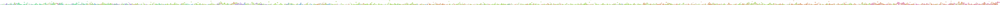

In [66]:
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12,
    random_state = 750
)
decision_tree.fit(X_train, y_train)

soil = list(treebin.Soil.unique())
soil.sort()

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [67]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [68]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 9,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [69]:
X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

need3 = pd.DataFrame([[np.mean(cv), np.mean(cv2), np.mean(cv3)]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
valbin = valbin.append(need3)

Train on 385620 samples, validate on 128540 samples
Epoch 1/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.6423 - accuracy: 0.7339 - val_loss: 0.5596 - val_accuracy: 0.7607
Epoch 2/200
385620/385620 [==============================] - 2s 6us/step - loss: 0.5283 - accuracy: 0.7756 - val_loss: 0.5089 - val_accuracy: 0.7858
Epoch 3/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4892 - accuracy: 0.7933 - val_loss: 0.4756 - val_accuracy: 0.7998
Epoch 4/200
385620/385620 [==============================] - 2s 6us/step - loss: 0.4638 - accuracy: 0.8054 - val_loss: 0.4506 - val_accuracy: 0.8133
Epoch 5/200
385620/385620 [==============================] - 2s 6us/step - loss: 0.4431 - accuracy: 0.8157 - val_loss: 0.4300 - val_accuracy: 0.8228
Epoch 6/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4271 - accuracy: 0.8226 - val_loss: 0.4210 - val_accuracy: 0.8268
Epoch 7/200
385620/385620 [===========================

In [70]:
X = treebin[rel + ['Soil', 'Area']]
y = treebin['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, stratify = treebin[['Area', 'Soil', 'Cover_Type']])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0869954 to fit



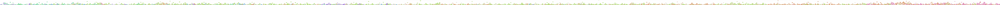

In [71]:
decision_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    min_samples_split = 10,
    min_samples_leaf = 2,
    max_features = 10,
    max_depth = 12,
    random_state = 750
)
decision_tree.fit(X_train, y_train)

# Render our tree.
dot_data = tree.export_graphviz(
    decision_tree, out_file=None,
    feature_names=X_train.columns,
    class_names=cov,
    filled=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [72]:
decision_tree.fit(X_train, y_train)
y_predict = decision_tree.predict(X_test)
cv = accuracy_score(y_test, y_predict)

In [73]:
rfc = ensemble.RandomForestClassifier(
    min_samples_split = 5,
    min_samples_leaf = 2,
    max_features = 10,
    max_depth = 12)

rfc.fit(X_train, y_train)
y_predict = rfc.predict(X_test)
cv2 = accuracy_score(y_test, y_predict)

In [74]:
X_train = scaler.fit_transform(X_train.values)
X_test = scaler.fit_transform(X_test.values)

y_train = get_val_array(y_train)
y_test = get_val_array(y_test)

model = Sequential()

model.add(Dense(7 * 4, input_dim = X.shape[1], activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 8, activation = 'relu'))
model.add(Dense(7 * 16, activation = 'relu'))
model.add(Dense(7, activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 200, batch_size = 375, shuffle = True, validation_data = (X_test, y_test))

loss, cv3 = model.evaluate(X_test, y_test)

need4 = pd.DataFrame([[np.mean(cv), np.mean(cv2), np.mean(cv3)]], columns = ['Decision Tree', 'Random Forest', 'Keras'])
valbin = valbin.append(need4)

Train on 385620 samples, validate on 128540 samples
Epoch 1/200
385620/385620 [==============================] - 4s 9us/step - loss: 0.6211 - accuracy: 0.7443 - val_loss: 0.5295 - val_accuracy: 0.7773
Epoch 2/200
385620/385620 [==============================] - 2s 6us/step - loss: 0.4993 - accuracy: 0.7893 - val_loss: 0.4813 - val_accuracy: 0.7958
Epoch 3/200
385620/385620 [==============================] - 3s 8us/step - loss: 0.4557 - accuracy: 0.8066 - val_loss: 0.4483 - val_accuracy: 0.8120
Epoch 4/200
385620/385620 [==============================] - 3s 9us/step - loss: 0.4271 - accuracy: 0.8205 - val_loss: 0.4175 - val_accuracy: 0.8251
Epoch 5/200
385620/385620 [==============================] - 3s 7us/step - loss: 0.4082 - accuracy: 0.8288 - val_loss: 0.3996 - val_accuracy: 0.8345
Epoch 6/200
385620/385620 [==============================] - 3s 9us/step - loss: 0.3910 - accuracy: 0.8374 - val_loss: 0.3880 - val_accuracy: 0.8378
Epoch 7/200
385620/385620 [===========================

In [75]:
end = time.time()

print(end - start)

9514.299186706543


In [76]:
ind = ['All - Area - Soil', 'All + Area - Soil', 'All - Area + Soil', 'All + Area + Soil']

valbin.index = ind
values.index = ind

values['New Decision Tree'] = valbin['Decision Tree']
values['New Random Forest'] = valbin['Random Forest']
values['New Keras'] = valbin['Keras']
values['Diff in DC Accuracy'] = values['New Decision Tree'] - values['Decision Tree']
values['Diff in RF Accuracy'] = values['New Random Forest'] - values['Random Forest']
values['Diff in Keras Accuracy'] = values['New Keras'] - values['Keras']

values

,Decision Tree,Random Forest,Keras,New Decision Tree,New Random Forest,New Keras,Diff in DC Accuracy,Diff in RF Accuracy,Diff in Keras Accuracy
All - Area - Soil,0.787337,0.828183,0.892360,0.792337,0.831803,0.903548,0.005000,0.003621,0.011187
All + Area - Soil,0.792025,0.834145,0.912257,0.802777,0.843823,0.911856,0.010752,0.009678,-0.000400
All - Area + Soil,0.802524,0.842819,0.902611,0.814968,0.848382,0.919185,0.012444,0.005563,0.016573
All + Area + Soil,0.809760,0.849112,0.906226,0.824086,0.854652,0.918096,0.014326,0.005541,0.011870


From the above dataframe, we can see that by reducing the Area variable to only include Areas 1 and 3 due to them making up 89% of the dataset, our overall classification accuracy at least slightly increased for all models. For the decision trees, we can see that all of our values increased by a very small amount, with three being over a 1% increase and one being half a percent. These increases aren't too significant and don't justify in the end removing 11% of our data.

While we did have increases for all values for our random forests as well, the values are even less substantial than with the decision trees, furthering removing justification from removing so much of our data. The reason RF increased so little was likely due to it already mitigating issues with error and bias from the start, causing the unevenness in distribution of areas to be less of an issue than it seemingly was with the DTs, which caused them to increase more.

Our Keras results gave us our first observation of a negative change in accuracy, being in the just Area category. This was an incredibly small drop though, not even being a tenth of a percent. In all other categories, however, the accuracy increases by at least 1%. All the positive changes here were larger than that of the RF change, and were higher than DC's change in no Area/no Soil and just Soil. Yet, just like with DC and RF, these minute of changes don't justify losing so much data.